# Approach 1 — LDA Topic Clusters Overlaid on GDV Point Clouds

**Question:** Do pre-derived LDA semantic topics (from image descriptions) spatially
cluster in the model's activation space?

**Logic:**
1. LDA topics are derived from text explanations (see `analysis/text_themes.py`)
2. We colour GDV/UMAP point clouds (originally computed on interestingness labels)
   with the LDA topic label of each image
3. If topic-coloured points cluster spatially → the model's internal representations
   encode visual content themes, not just interestingness ratings
4. For each topic: show images AND where they sit in the GDV point cloud

**Note on layer selection:** we use the **best layer overall** (maximum GDV across
all modalities — vision, projector, language), not just the best vision layer.
In a multimodal model the richest representations often emerge in later language
layers after cross-modal fusion.


In [1]:
import sys, os
# Navigate to project root when running from analysis/ subfolder
if os.path.basename(os.getcwd()) == 'analysis':
    os.chdir('..')
sys.path.insert(0, '.')
import re, pickle, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from PIL import Image
from sklearn.metrics import silhouette_score
from collections import defaultdict

warnings.filterwarnings('ignore')
%matplotlib inline
plt.rcParams['figure.dpi'] = 110


In [2]:
# ── Paths & constants ─────────────────────────────────────────────────────────
GE_DIR      = 'data/experiments/gender_emotion'
METRICS_DIR = 'results/experiments/metrics'
IMG_DIR     = 'data/imagesDemographics'
LDA_DIR     = 'results/experiments/gender_emotion_analysis/lda'
OUT_DIR     = 'results/experiments/gender_emotion_analysis/lda/approach1'
os.makedirs(OUT_DIR, exist_ok=True)

EXPERIMENTS = [
    'female_anger', 'female_fear', 'female_disgust', 'female_sad',
    'female_amusement', 'female_awe', 'female_contentment',
    'female_excitement', 'male_anger',
]
SHORT = {
    'female_anger':'F-Anger','female_fear':'F-Fear','female_disgust':'F-Disgust',
    'female_sad':'F-Sad','female_amusement':'F-Amus','female_awe':'F-Awe',
    'female_contentment':'F-Con','female_excitement':'F-Exc','male_anger':'M-Anger',
}
LABEL_ORDER  = ['Not Interesting','Slightly Interesting','Moderately Interesting',
                'Very Interesting','Extremely Interesting']
LABEL_COLORS = dict(zip(LABEL_ORDER,['#d62728','#ff7f0e','#1f77b4','#2ca02c','#9467bd']))
N_TOPICS     = 10
TOPIC_CMAP   = plt.colormaps['tab10']
TOPIC_COLORS = [TOPIC_CMAP(t/N_TOPICS) for t in range(N_TOPICS)]


In [3]:
# ── Load LDA artefacts ────────────────────────────────────────────────────────
with open(f'{LDA_DIR}/lda_artefacts.pkl','rb') as f:
    arts = pickle.load(f)
lda, vectorizer, topic_words, df_meta = (
    arts['lda'], arts['vectorizer'], arts['topic_words'], arts['df_meta'])
topic_cols = [f'topic_{t}' for t in range(N_TOPICS)]

# Per-image dominant topic (average across all 9 conditions)
img_topic_mean = df_meta.groupby('image_idx')[topic_cols].mean()
img_dominant   = img_topic_mean.idxmax(axis=1).str.replace('topic_','').astype(int)
idx2fn = df_meta[['image_idx','filename']].drop_duplicates().set_index('image_idx')['filename']

print("Topics loaded:")
for t, words in enumerate(topic_words):
    print(f"  T{t+1:02d}: {', '.join(words[:6])}")


Topics loaded:
  T01: unique, woman, unusual, combination, pose, blend
  T02: flower, flowers, playing, unique, station, color
  T03: child, display, field, historical, military, walking
  T04: vibrant, car, bird, colors, work, right
  T05: unique, building, design, architecture, vintage, flight
  T06: unusual, dog, unique, moderately, appearance, moderate
  T07: man, person, setting, winter, mountain, cultural
  T08: serene, calm, landscape, calmness, water, awe
  T09: people, casual, group, event, setting, young
  T10: old, train, nostalgia, statue, history, background


In [4]:
# ── Load GDV data for all experiments ─────────────────────────────────────────
gdv_data = {}
for exp in EXPERIMENTS:
    key = f'gender_{exp}'
    with open(f'{METRICS_DIR}/{key}/gdv.pkl','rb') as f:
        gdv_data[exp] = pickle.load(f)

# ── Best OVERALL layer (all modalities) for each experiment ───────────────────
best_layer = {}
for exp in EXPERIMENTS:
    best_layer[exp] = min(gdv_data[exp]["gdv_per_layer"],
                          key=gdv_data[exp]["gdv_per_layer"].get)

print("Best overall layer per experiment (may be vision OR language):")
for exp in EXPERIMENTS:
    lk  = best_layer[exp]
    gdv = gdv_data[exp]['gdv_per_layer'][lk]
    mod = lk.split('_')[0]
    print(f"  {SHORT[exp]:<10}  {lk:<30}  GDV={gdv:.4f}  ({mod})")


Best overall layer per experiment (may be vision OR language):
  F-Anger     language_47_D5120               GDV=-0.5569  (language)
  F-Fear      language_44_D5120               GDV=-0.4832  (language)
  F-Disgust   language_45_D5120               GDV=-0.4755  (language)
  F-Sad       language_45_D5120               GDV=-0.5484  (language)
  F-Amus      language_47_D5120               GDV=-0.3320  (language)
  F-Awe       language_45_D5120               GDV=-0.3086  (language)
  F-Con       language_45_D5120               GDV=-0.4629  (language)
  F-Exc       language_45_D5120               GDV=-0.3185  (language)
  M-Anger     language_47_D5120               GDV=-0.5583  (language)


---
## 1. GDV Point Clouds: Label vs Topic Colouring (best overall layer)

**Left panel:** coloured by interestingness label (original GDV analysis)
**Right panel:** coloured by dominant LDA topic (does text-derived theme cluster spatially?)


In [5]:
def get_umap(exp, layer_key, setup_idx=0):
    info = gdv_data[exp]['layer_data'][layer_key]
    proj = info['projections']['umap']
    if not proj:                        # fall back to t-SNE
        proj = info['projections']['tsne']
    if not proj:
        return None, None
    key    = list(proj.keys())[setup_idx]
    coords = np.array(proj[key]['coords'])
    fnames = info['samples']['filenames']
    return coords, fnames

def plot_label_vs_topic(exp, layer_key, ax_label, ax_topic):
    coords, fnames = get_umap(exp, layer_key)
    if coords is None:
        return

    # Build lookup for this condition
    sub    = df_meta[df_meta['condition']==exp]
    fn_lbl = {r['filename']: r['label']                              for _,r in sub.iterrows()}
    fn_top = {r['filename']: int(r[topic_cols].values.argmax())      for _,r in sub.iterrows()}

    lbl_ord = [fn_lbl.get(fn, None) for fn in fnames]
    top_ord = [fn_top.get(fn, -1)   for fn in fnames]

    # Label plot
    for lbl in LABEL_ORDER:
        m = [l==lbl for l in lbl_ord]
        if any(m):
            ax_label.scatter(coords[m,0], coords[m,1], c=LABEL_COLORS[lbl],
                             s=12, alpha=0.7, label=lbl[:12], linewidths=0)
    gdv = gdv_data[exp]['gdv_per_layer'][layer_key]
    ax_label.set_title(f'Interestingness label\n{SHORT[exp]} | {layer_key}\nGDV={gdv:.4f}', fontsize=8)
    ax_label.legend(fontsize=5, markerscale=1.2, loc='upper right')
    ax_label.set_xticks([]); ax_label.set_yticks([])

    # Topic plot
    for t in range(N_TOPICS):
        m = [tp==t for tp in top_ord]
        if any(m):
            ax_topic.scatter(coords[m,0], coords[m,1], c=[TOPIC_COLORS[t]],
                             s=12, alpha=0.7, label=f'T{t+1}:{topic_words[t][0]}',
                             linewidths=0)
    ax_topic.set_title(f'Dominant LDA topic\n{SHORT[exp]} | {layer_key}', fontsize=8)
    ax_topic.legend(fontsize=5, markerscale=1.2, loc='upper right', ncol=2)
    ax_topic.set_xticks([]); ax_topic.set_yticks([])


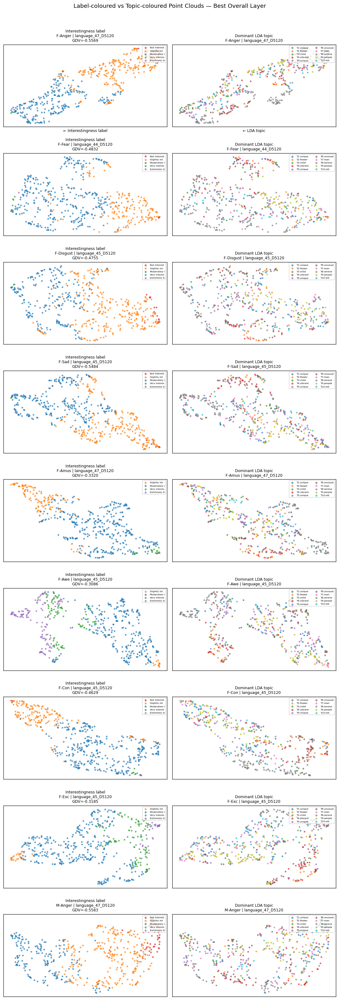

In [6]:
# All 9 conditions, best overall layer — side by side
fig, axes = plt.subplots(len(EXPERIMENTS), 2,
                          figsize=(10, len(EXPERIMENTS)*3.2))

for i, exp in enumerate(EXPERIMENTS):
    plot_label_vs_topic(exp, best_layer[exp], axes[i,0], axes[i,1])
    if i == 0:
        axes[i,0].set_xlabel('← Interestingness label', fontsize=8)
        axes[i,1].set_xlabel('← LDA topic', fontsize=8)

plt.suptitle('Label-coloured vs Topic-coloured Point Clouds — Best Overall Layer',
             fontsize=12, y=1.01)
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/label_vs_topic_all_conditions.png', dpi=120, bbox_inches='tight')
plt.show()


---
## 2. Topic Cluster Silhouette — All Layers, All Conditions

Silhouette of LDA-topic clusters in UMAP 2-D space at every layer.
Positive/higher silhouette → topic-coloured points are spatially coherent.

**This answers: at which layer do semantic content themes emerge in activation space?**


In [7]:
MOD_ORDER = {'vision':0,'projector':1,'language':2,'unknown':3}

def _sort_key(lk):
    parts = lk.split('_D'); base = parts[0]; mod, num = base.split('_',1)
    return (MOD_ORDER.get(mod,3), int(num))

PROBE_LAYERS = sorted(gdv_data[EXPERIMENTS[0]]['sorted_layers'], key=_sort_key)

def topic_silhouette(exp, layer_key):
    coords, fnames = get_umap(exp, layer_key)
    if coords is None or len(coords)<20: return float('nan')
    sub    = df_meta[df_meta['condition']==exp]
    fn_map = {r['filename']: int(r[topic_cols].values.argmax()) for _,r in sub.iterrows()}
    tlabels= np.array([fn_map.get(fn,-1) for fn in fnames])
    valid  = tlabels>=0
    if valid.sum()<20 or len(np.unique(tlabels[valid]))<2: return float('nan')
    try: return silhouette_score(coords[valid], tlabels[valid])
    except: return float('nan')

# Compute for a subset of layers (every 4th to keep runtime reasonable)
probe_subset = PROBE_LAYERS[::2]
rows = []
for exp in EXPERIMENTS:
    for lk in probe_subset:
        sil = topic_silhouette(exp, lk)
        gdv = gdv_data[exp]['gdv_per_layer'].get(lk, float('nan'))
        mod = lk.split('_')[0]
        rows.append({'Condition':SHORT[exp],'Layer':lk,'Modality':mod,
                     'Silhouette':sil,'GDV':gdv})
sil_df = pd.DataFrame(rows)
print("Silhouette computed for", len(sil_df), "layer×condition combinations")
print("Mean silhouette by modality:")
print(sil_df.groupby('Modality')['Silhouette'].mean().round(3))


Silhouette computed for 369 layer×condition combinations
Mean silhouette by modality:
Modality
language   -0.151
vision     -0.140
Name: Silhouette, dtype: float64


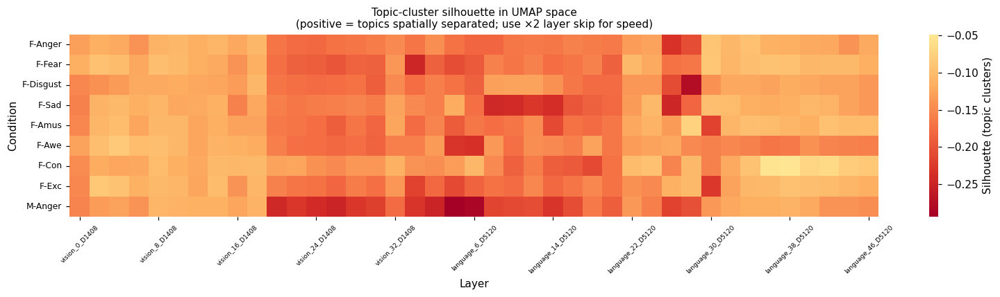

In [8]:
# Heatmap: condition × layer (subset)
pivot = sil_df.pivot(index='Condition', columns='Layer', values='Silhouette')
# Sort columns by layer position
col_order = [l for l in probe_subset if l in pivot.columns]
pivot = pivot[col_order]
# Reorder rows
row_order = [SHORT[e] for e in EXPERIMENTS if SHORT[e] in pivot.index]
pivot = pivot.reindex(row_order)

fig, ax = plt.subplots(figsize=(max(14, len(col_order)*0.35), 4))
sns.heatmap(pivot, cmap='RdYlGn', center=0, ax=ax, linewidths=0,
            cbar_kws={'label':'Silhouette (topic clusters)'}, xticklabels=4)
ax.set_title('Topic-cluster silhouette in UMAP space\n'
             '(positive = topics spatially separated; use ×2 layer skip for speed)', fontsize=10)
ax.tick_params(axis='x', rotation=45, labelsize=6)
ax.tick_params(axis='y', rotation=0, labelsize=8)
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/topic_silhouette_heatmap.png', dpi=120, bbox_inches='tight')
plt.show()


---
## 3. Image Gallery per Topic — with GDV Point Cloud

For each topic: top-20 images by mean topic weight **+ the GDV point cloud**
showing where those images sit (highlighted) among all 500 images.

The point cloud is coloured by interestingness label (original analysis).
The topic's images are circled / enlarged to show their distribution in
the activation-space geometry.


In [9]:
def load_thumb(path, size=(80,80)):
    try:
        img = Image.open(path).convert('RGB')
        img.thumbnail(size, Image.LANCZOS)
        out = Image.new('RGB', size, (210,210,210))
        out.paste(img, ((size[0]-img.width)//2, (size[1]-img.height)//2))
        return np.array(out)
    except:
        return np.ones((*size,3), np.uint8)*180

def gallery_with_pointcloud(topic_idx, exp_for_cloud='female_awe', top_n=20):
    t  = topic_idx
    tc = f'topic_{t}'

    # ── Top images ──────────────────────────────────────────────────────────
    rank    = img_topic_mean[tc].sort_values(ascending=False)
    top_idxs = rank.index[:top_n].tolist()
    top_fns  = [idx2fn[i] for i in top_idxs]
    top_set  = set(top_fns)

    # ── Point cloud (best overall layer of exp_for_cloud) ───────────────────
    lk            = best_layer[exp_for_cloud]
    coords, fnames = get_umap(exp_for_cloud, lk)

    sub     = df_meta[df_meta['condition']==exp_for_cloud]
    fn_lbl  = {r['filename']:r['label'] for _,r in sub.iterrows()}
    lbl_ord = [fn_lbl.get(fn,'?') for fn in fnames]
    in_topic= np.array([fn in top_set for fn in fnames])

    # ── Layout: image grid (top) + point cloud (bottom-left) + label dist (bottom-right) ──
    import matplotlib.gridspec as gridspec
    fig = plt.figure(figsize=(20, 9))
    gs  = gridspec.GridSpec(2, 2, height_ratios=[4.5, 4], hspace=0.35, wspace=0.25)

    # Image grid
    ncols_g = 10
    nrows_g = (top_n + ncols_g - 1) // ncols_g
    gs_top  = gridspec.GridSpecFromSubplotSpec(nrows_g, ncols_g, subplot_spec=gs[0,:],
                                               hspace=0.04, wspace=0.04)
    for gi, (idx, fn) in enumerate(zip(top_idxs, top_fns)):
        ax = fig.add_subplot(gs_top[gi//ncols_g, gi%ncols_g])
        ax.imshow(load_thumb(f'{IMG_DIR}/{fn}'))
        ax.set_title(f'{rank[idx]:.2f}', fontsize=5, pad=1)
        ax.axis('off')

    fig.text(0.5, 0.98,
             f'Topic {t+1} — {", ".join(topic_words[t][:6])}',
             ha='center', va='top', fontsize=12, fontweight='bold', color=TOPIC_COLORS[t])

    # ── Point cloud ─────────────────────────────────────────────────────────
    ax_cloud = fig.add_subplot(gs[1, 0])
    if coords is not None:
        # background: all points, coloured by interestingness
        for lbl in LABEL_ORDER:
            m = [l==lbl for l in lbl_ord]
            if any(m):
                ax_cloud.scatter(coords[m,0], coords[m,1],
                                 c=LABEL_COLORS[lbl], s=8, alpha=0.35, linewidths=0)
        # overlay: topic images (larger, full opacity, black edge)
        if in_topic.any():
            ax_cloud.scatter(coords[in_topic,0], coords[in_topic,1],
                             c=[TOPIC_COLORS[t]], s=45, alpha=1.0,
                             edgecolors='black', linewidths=0.8, zorder=5,
                             label=f'T{t+1} images')
        gdv = gdv_data[exp_for_cloud]['gdv_per_layer'][lk]
        ax_cloud.set_title(f'GDV point cloud — {SHORT[exp_for_cloud]}\n'
                           f'{lk} (GDV={gdv:.4f})\n'
                           f'highlighted = T{t+1} images', fontsize=8)
        ax_cloud.legend(fontsize=7, loc='upper right')
        ax_cloud.set_xticks([]); ax_cloud.set_yticks([])
        # Label colour legend
        patches = [mpatches.Patch(color=LABEL_COLORS[l], label=l[:14]) for l in LABEL_ORDER]
        ax_cloud.legend(handles=patches, fontsize=6, loc='lower left', ncol=1)
    else:
        ax_cloud.text(0.5, 0.5, 'No UMAP projection', ha='center', va='center')

    # ── Point cloud for different condition (e.g. female_anger for contrast) ──
    ax_cloud2 = fig.add_subplot(gs[1, 1])
    exp2 = 'female_anger'
    lk2  = best_layer[exp2]
    c2, fn2 = get_umap(exp2, lk2)
    if c2 is not None:
        sub2    = df_meta[df_meta['condition']==exp2]
        fn_lbl2 = {r['filename']:r['label'] for _,r in sub2.iterrows()}
        lbl2    = [fn_lbl2.get(fn,'?') for fn in fn2]
        in2     = np.array([fn in top_set for fn in fn2])
        for lbl in LABEL_ORDER:
            m = [l==lbl for l in lbl2]
            if any(m):
                ax_cloud2.scatter(c2[m,0], c2[m,1], c=LABEL_COLORS[lbl],
                                  s=8, alpha=0.35, linewidths=0)
        if in2.any():
            ax_cloud2.scatter(c2[in2,0], c2[in2,1], c=[TOPIC_COLORS[t]],
                              s=45, alpha=1.0, edgecolors='black', linewidths=0.8, zorder=5)
        gdv2 = gdv_data[exp2]['gdv_per_layer'][lk2]
        ax_cloud2.set_title(f'GDV point cloud — {SHORT[exp2]}\n'
                            f'{lk2} (GDV={gdv2:.4f})', fontsize=8)
        ax_cloud2.set_xticks([]); ax_cloud2.set_yticks([])

    plt.savefig(f'{OUT_DIR}/gallery_topic_{t+1}.png', dpi=120, bbox_inches='tight')
    plt.show()
    print(f"Saved gallery for Topic {t+1}")


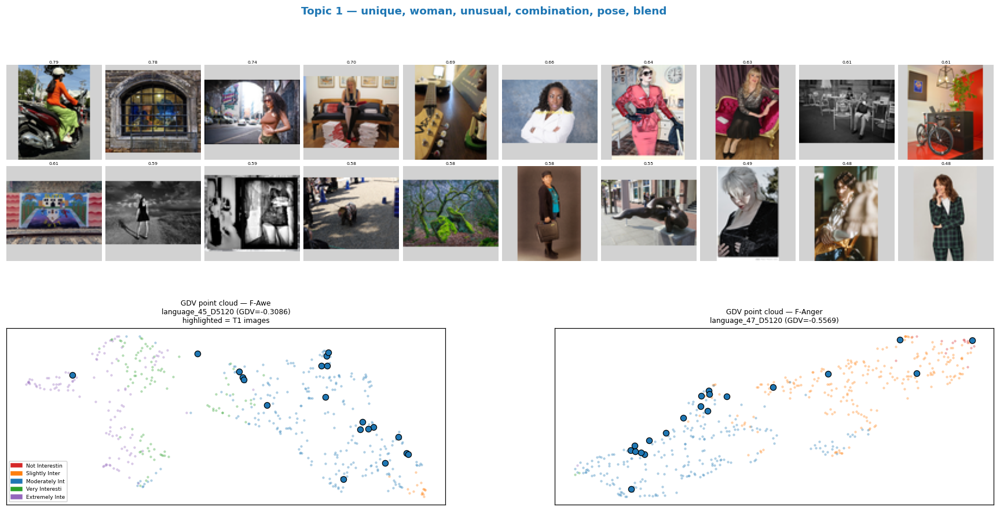

Saved gallery for Topic 1


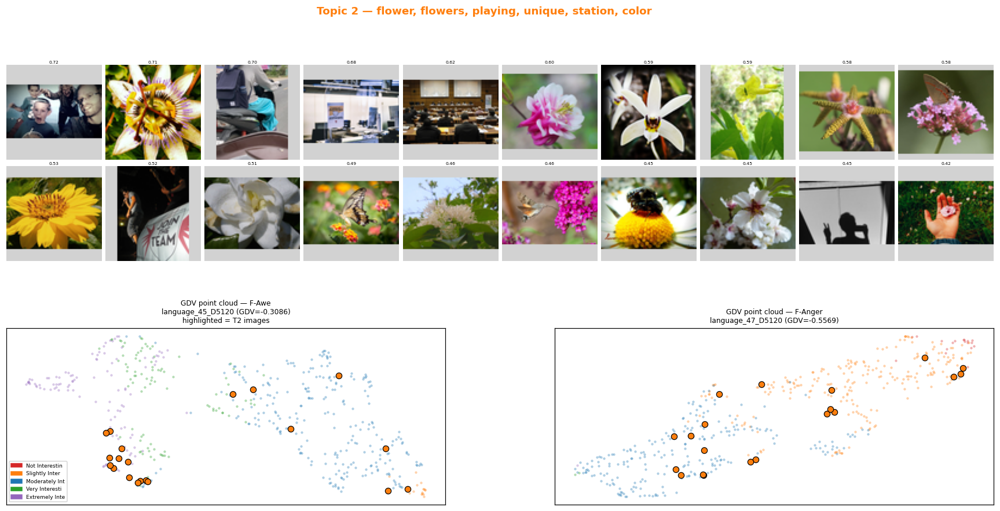

Saved gallery for Topic 2


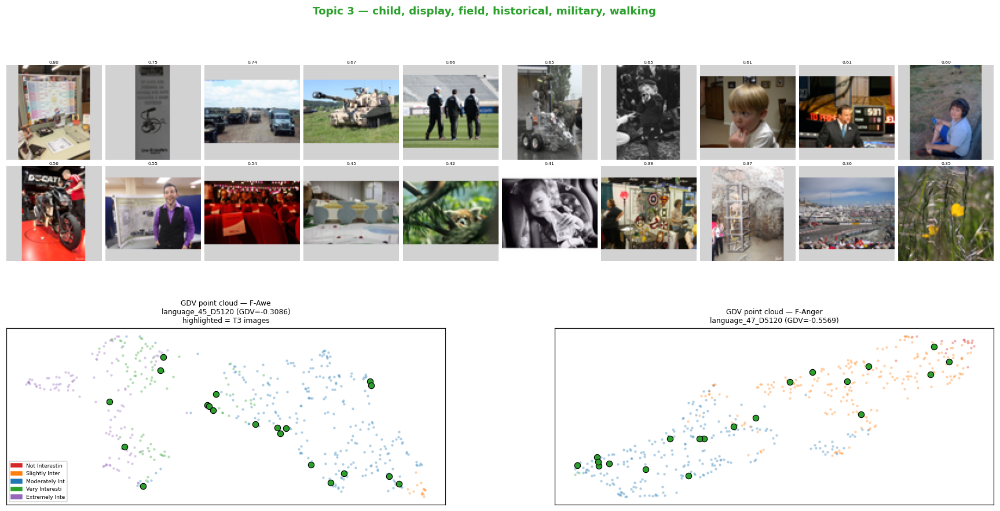

Saved gallery for Topic 3


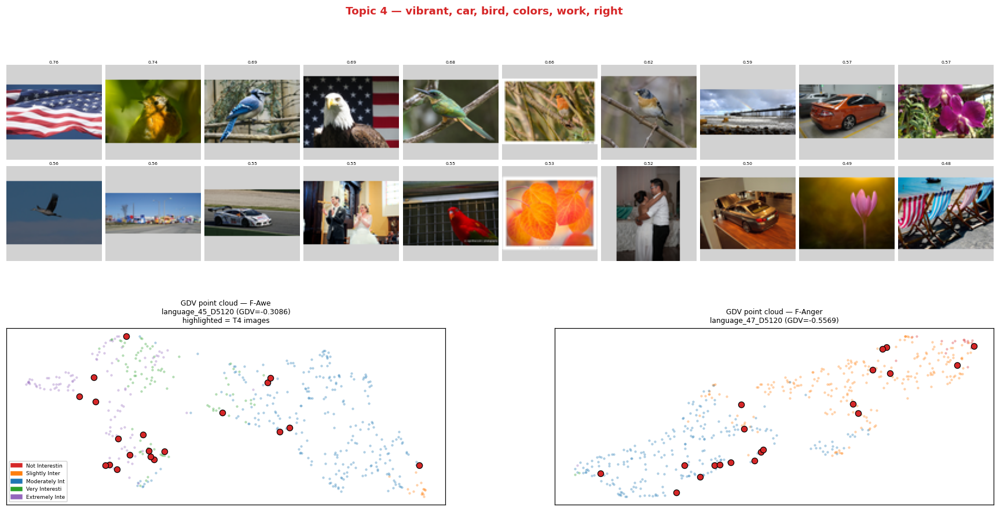

Saved gallery for Topic 4


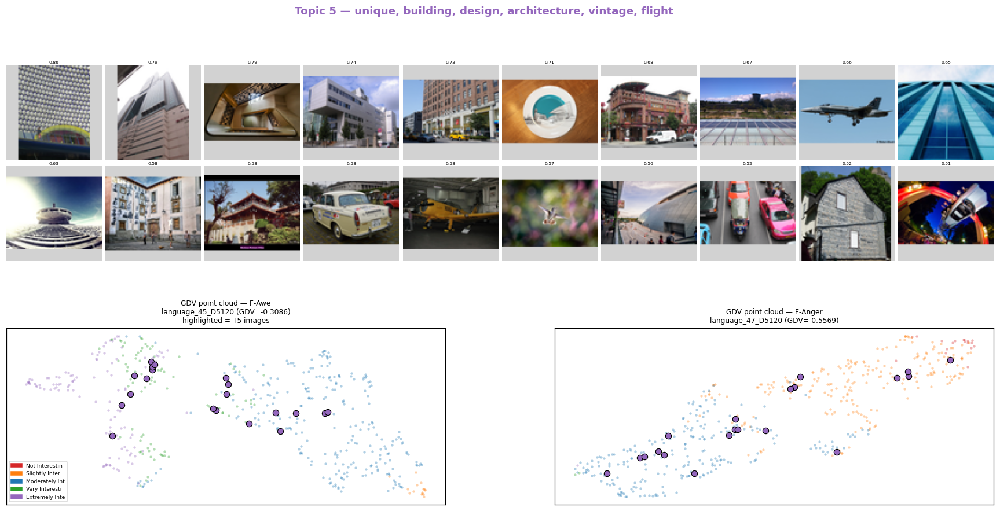

Saved gallery for Topic 5


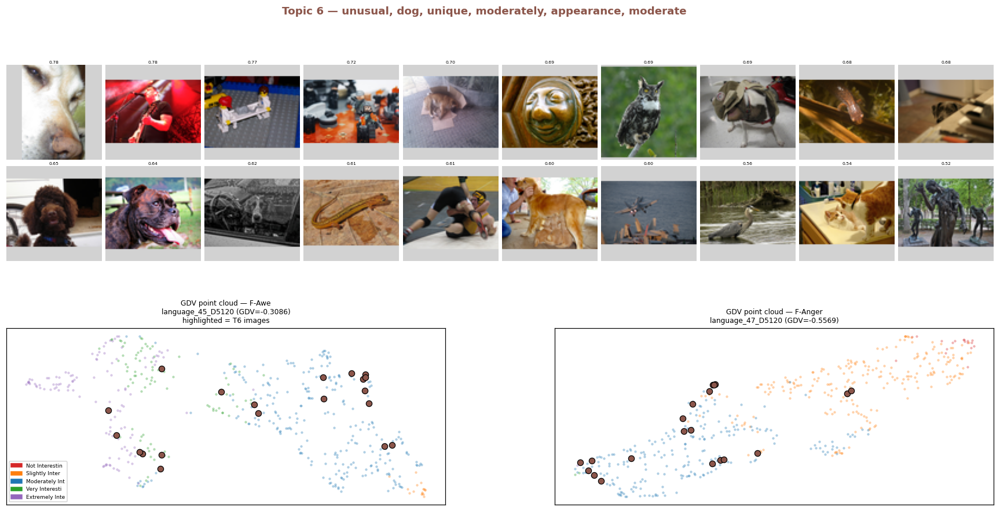

Saved gallery for Topic 6


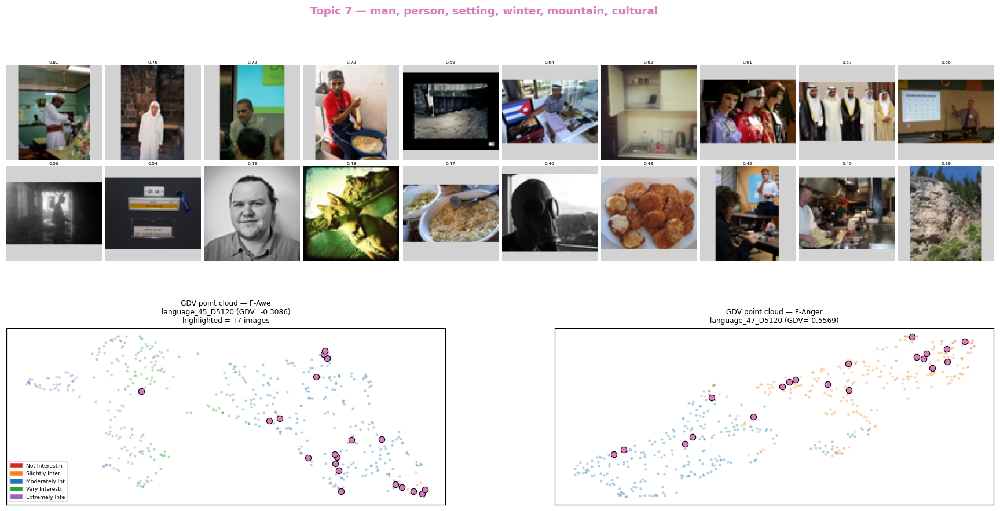

Saved gallery for Topic 7


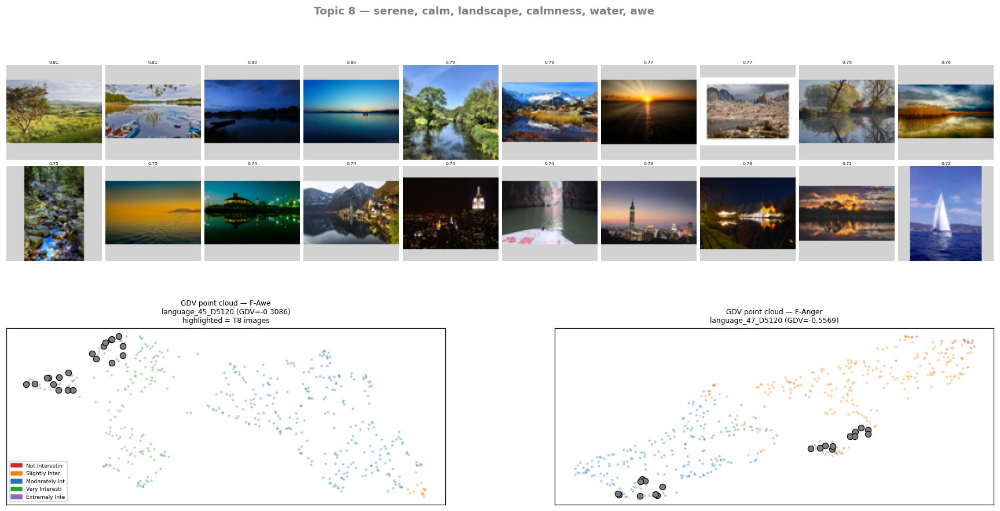

Saved gallery for Topic 8


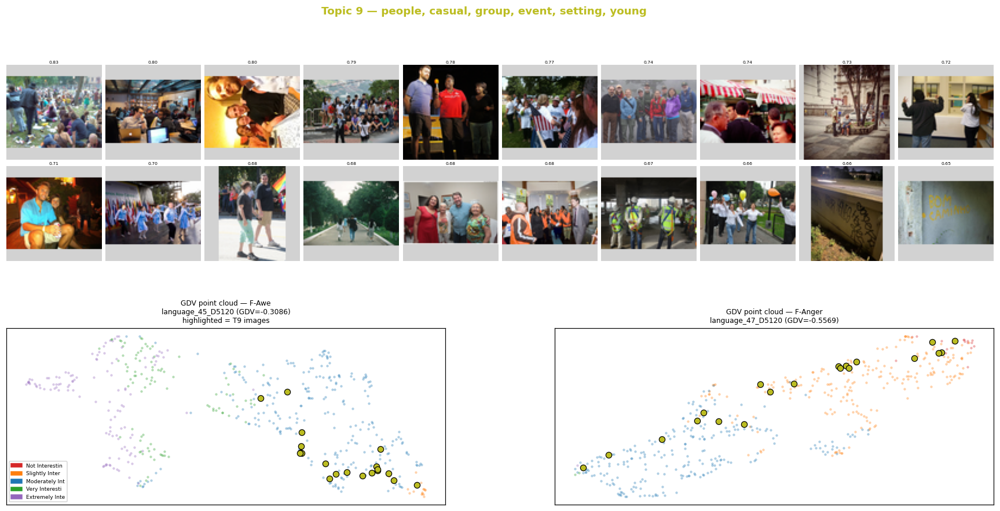

Saved gallery for Topic 9


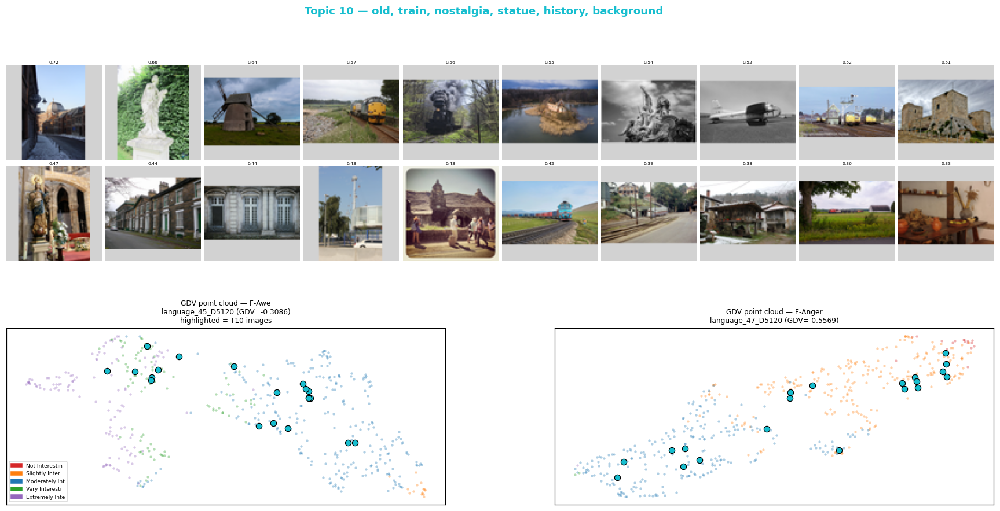

Saved gallery for Topic 10


In [10]:
# Render all topic galleries
for t in range(N_TOPICS):
    gallery_with_pointcloud(t, exp_for_cloud='female_awe', top_n=20)


---
## 4. Visual Feature Validation (Vision PCA)

Cross-validate text-derived LDA topics against vision encoder activations.
If LDA topics correspond to genuine visual themes, they should cluster in visual
feature space too — without any reference to text.


Vision embeddings: (500, 1408)  key=vision_layer_33_cls
PCA variance: 85.0%


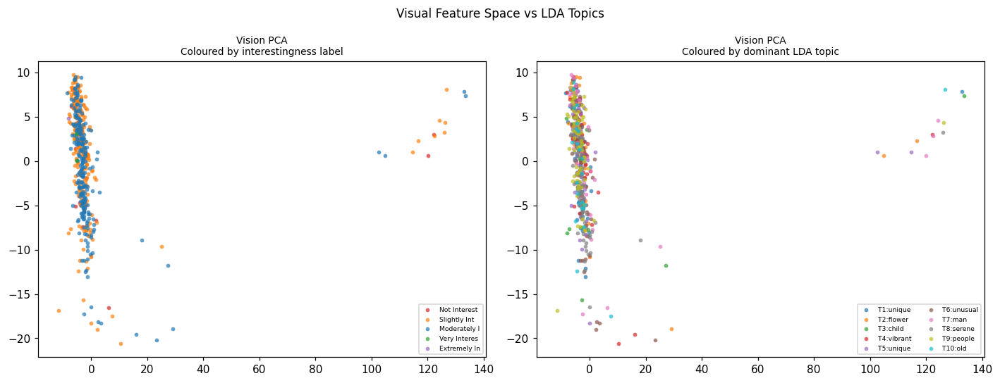


Silhouette (LDA topics in visual PCA space): -0.1970


K-means silhouette (visual space):             0.0071
ARI (LDA topics vs visual k-means):            0.0258
  ARI=1 → perfect agreement; ARI≈0 → independent


In [11]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import adjusted_rand_score
from sklearn.neighbors import NearestNeighbors

# Load last vision CLS layer activations (condition-independent)
ref = np.load(f'{GE_DIR}/results_female_anger.npy', allow_pickle=True).item()['results']
lkey = 'interestingness_label' if 'interestingness_label' in ref[0] else 'interestingness'
vision_keys = [k for k in ref[0]['embeddings'] if 'vision' in k.lower()]
rich_key    = vision_keys[-1]   # last vision layer = richest
fnames_ref  = [r['filename'] for r in ref]
vis_emb     = np.array([np.array(r['embeddings'][rich_key]) for r in ref])
print(f"Vision embeddings: {vis_emb.shape}  key={rich_key}")

pca = PCA(n_components=2, random_state=42)
vis_2d = pca.fit_transform(vis_emb)
print(f"PCA variance: {pca.explained_variance_ratio_.sum()*100:.1f}%")

fn2idx = {fn:idx for idx,fn in idx2fn.items()}
dom = np.array([int(img_dominant[fn2idx[fn]]) if fn in fn2idx else -1 for fn in fnames_ref])
valid = dom>=0

fig, axes = plt.subplots(1,2, figsize=(13,5))
labels_ref = [r[lkey] for r in ref]
for lbl in LABEL_ORDER:
    m = [l==lbl for l in labels_ref]
    axes[0].scatter(vis_2d[m,0], vis_2d[m,1], c=LABEL_COLORS[lbl], s=14, alpha=0.7,
                    label=lbl[:12], linewidths=0)
axes[0].set_title(f'Vision PCA\nColoured by interestingness label', fontsize=9)
axes[0].legend(fontsize=6)

for t in range(N_TOPICS):
    m = (dom==t)&valid
    if m.any():
        axes[1].scatter(vis_2d[m,0], vis_2d[m,1], c=[TOPIC_COLORS[t]], s=14, alpha=0.7,
                        label=f'T{t+1}:{topic_words[t][0]}', linewidths=0)
axes[1].set_title(f'Vision PCA\nColoured by dominant LDA topic', fontsize=9)
axes[1].legend(fontsize=6, ncol=2)
plt.suptitle('Visual Feature Space vs LDA Topics', fontsize=11)
plt.tight_layout()
plt.savefig(f'{OUT_DIR}/vision_pca_vs_topics.png', dpi=130, bbox_inches='tight')
plt.show()

sil_vis = silhouette_score(vis_2d[valid], dom[valid])
print(f"\nSilhouette (LDA topics in visual PCA space): {sil_vis:.4f}")

km = KMeans(n_clusters=N_TOPICS, random_state=42, n_init=10)
vis_km = km.fit_predict(StandardScaler().fit_transform(vis_emb))
ari    = adjusted_rand_score(dom[valid], vis_km[valid])
sil_km = silhouette_score(vis_2d, vis_km)
print(f"K-means silhouette (visual space):             {sil_km:.4f}")
print(f"ARI (LDA topics vs visual k-means):            {ari:.4f}")
print("  ARI=1 → perfect agreement; ARI≈0 → independent")


---
## Summary

| Analysis | Key insight |
|----------|-------------|
| §1 Label vs Topic colouring | Whether text-derived topics cluster spatially (visual check) |
| §2 Silhouette heatmap | At which layer / condition topic-spatial alignment is strongest |
| §3 Image galleries + point clouds | Per-topic: images shown + where they sit in GDV space |
| §4 Vision PCA validation | Whether topics correspond to visual feature clusters (ARI) |
